In [81]:
import datetime as dt
import math
import os
import random
import sys
import time

import keras
import numpy as np
import pandas as pd
import quantstats as qs
import sklearn
import talib
import tensorflow as tf
import tensorflow_addons as tfa
import yfinance as yf
from fastai.tabular.core import df_shrink
from matplotlib import pyplot as plt

from trading_modules.configurations import shift_predictions
from trading_modules.create_backtest import (
    VaR,
    average_drawdown,
    average_drawdown_squared,
    beta,
    burke_ratio,
    calmar_ratio,
    classification_report_display,
    conditional_sharpe_ratio,
    confusion_matrix_display,
    cVaR,
    excess_var,
    financial_evaluation,
    gain_loss_ratio,
    hpm,
    information_ratio,
    kappa_three_ratio,
    lpm,
    max_drawdown,
    modigliani_ratio,
    omega_ratio,
    plain_classification_report,
    plot_charts,
    plot_init,
    plot_tables,
    second_2_minute_converter,
    sharpe_ratio,
    sortino_ratio,
    sterling_ratio,
    treynor_ratio,
    upside_potential_ratio,
    volatility,
)
from trading_modules.create_data import (
    CMF,
    HMA,
    adjustPrices,
    create_2d_data,
    create_all_indicators_in_talib,
    create_labels,
    number_null_and_nan,
    one_hot,
    pltcolor,
    reverse_one_hot,
    show_label_distribution,
    show_price_and_labels,
    show_prices,
    trendNormalizePrices,
)
from trading_modules.create_neural_networks import (
    create_model_CNN_2D,
    create_model_GRU,
    create_model_LSTM,
    create_model_MLP,
    model_ho,
    model_train_test,
    show_epoch_and_score,
)
from trading_modules.create_strategy import (
    create_bollinger_bands_predictions,
    create_buy_and_hold_predictions,
    create_ema_crossover_predictions,
    create_random_predictions,
    create_rsi_predictions,
)
from trading_modules.feaure_engineering import (
    feature_selection,
    scaling,
)

<h1 style="font-size:40px;"> <center> CONSTANTS </center> </h1>

In [82]:
SEED = 42
TRAIN_TEST_EPOCH = 10
HO_EPOCH = 10
HO_TRIALS = 10
FINAL_MODEL_EPOCH = 20
EPOCH_BEFORE_OVERFIT = 30
MAX_ROW_AND_COLUMN_2_DISPLAY = 100
LENGTH = 30
METRIC = "f1_score"  # precision, recall, f1_score
TICKER = "SPY"
BENCHMARK_TICKER = "SPY"
START_DATE = "2000-01-01"
END_DATE = "2023-01-01"
INTERVAL = "1d"

SEE_ALL_EPOCHS = True
RUN_BUY_AND_HOLD = True
RUN_RANDOM_PREDICTION = True
RUN_RSI = True
RUN_EMA_CROSSOVER = True
RUN_BOLLINGER_BANDS = True
RUN_MLP = True
RUN_LSTM = True
RUN_GRU = True
RUN_CNN = True

In [83]:
pd.set_option("display.max_rows", MAX_ROW_AND_COLUMN_2_DISPLAY)
pd.set_option("display.max_columns", MAX_ROW_AND_COLUMN_2_DISPLAY)

In [84]:
np.random.seed(SEED)

In [85]:
notebook_start_time = time.time()

<h1 style="font-size:40px;"> <center> DATA PREPROCESSING </center> </h1>

In [86]:
prices = yf.download(
    TICKER,
    start=START_DATE,
    end=END_DATE,
    interval=INTERVAL,
    progress=False,
    auto_adjust=True,
)
prices

,Open,High,Low,Close,Volume
Date,,,,,
2000-01-03 00:00:00-05:00,96.782535,96.782535,93.926390,94.946442,8164300
2000-01-04 00:00:00-05:00,93.702001,94.048819,91.162071,91.233475,8089800
2000-01-05 00:00:00-05:00,91.355850,92.396303,89.601361,91.396652,12177900
2000-01-06 00:00:00-05:00,91.151812,92.375873,89.927750,89.927750,6227200
2000-01-07 00:00:00-05:00,91.600671,95.150452,91.437462,95.150452,8066500
...,...,...,...,...,...
2022-12-23 00:00:00-05:00,378.206578,381.603617,376.592742,381.454193,59857300
2022-12-27 00:00:00-05:00,381.334651,381.693267,378.206574,379.949921,51638200
2022-12-28 00:00:00-05:00,379.880163,381.932359,374.988858,375.227936,70911500


In [87]:
print(
    f"{prices.memory_usage().sum()/(1024**2)} MB is used before df_shrink"
)
prices = df_shrink(prices, int2uint=True)
print(
    f"{prices.memory_usage().sum()/(1024**2)} MB is used after df_shrink"
)

0.39092254638671875 MB is used before df_shrink
0.2805442810058594 MB is used after df_shrink


In [88]:
show_prices(
    ticker=TICKER,
    df=prices,
    desc=f"Close Price of {TICKER}",
)

<h1 style="font-size:30px;"> <center> Data Labeling </center> </h1>

In [89]:
prices_with_label = create_labels(prices)
prices_with_label.head(5)

,Open,High,Low,Close,Volume,Label
Date,,,,,,
2000-01-03 00:00:00-05:00,96.782532,96.782532,93.926392,94.946442,8164300,0
2000-01-04 00:00:00-05:00,93.702003,94.048820,91.162071,91.233475,8089800,0
2000-01-05 00:00:00-05:00,91.355850,92.396301,89.601364,91.396652,12177900,0
2000-01-06 00:00:00-05:00,91.151810,92.375870,89.927750,89.927750,6227200,0
2000-01-07 00:00:00-05:00,91.600670,95.150452,91.437462,95.150452,8066500,0


In [90]:
show_label_distribution(prices_with_label)

In [91]:
show_price_and_labels(
    ticker=TICKER,
    df=prices_with_label,
    desc=f"Close Price with Labels of {TICKER}",
)

<h1 style="font-size:30px;"> <center> Trend Normalize and Visualize </center> </h1>

In [92]:
tn_prices_with_label = trendNormalizePrices(prices_with_label)
tn_prices_with_label

,Open,High,Low,Close,Volume,Label
Date,,,,,,
2000-02-15 00:00:00-05:00,-1.007668,0.277595,-1.956322,0.185790,11078300,0
2000-02-16 00:00:00-05:00,0.100100,0.467318,-0.930151,-0.797544,8845400,0
2000-02-17 00:00:00-05:00,0.559759,0.559759,-0.888712,-0.847910,7584200,0
2000-02-18 00:00:00-05:00,0.295135,0.295135,-2.479408,-2.030586,9409200,0
2000-02-22 00:00:00-05:00,-1.686696,-0.931859,-2.767949,-1.829503,16415400,0
...,...,...,...,...,...,...
2022-12-23 00:00:00-05:00,-7.278269,-3.881235,-8.892100,-4.030650,59857300,0
2022-12-27 00:00:00-05:00,-2.824486,-2.465874,-5.952569,-4.209222,51638200,0
2022-12-28 00:00:00-05:00,-2.228298,-0.176082,-7.119594,-6.880519,70911500,0


In [93]:
show_prices(
    ticker=TICKER,
    df=tn_prices_with_label,
    desc=f"Close TN-Price of {TICKER}",
)

<h1 style="font-size:30px;"> <center> Adding Technical Indicators </center> </h1>

In [125]:
tn_prices_and_indicators_with_label = create_all_indicators_in_talib(
    df=tn_prices_with_label, periods=list(range(6, 22))
)

In [126]:
tn_prices_and_indicators_with_label.head(5)

,Open,High,Low,Close,Volume,Label,RSI-6,WILLR-6,STOCH-6,STOCHF-6,SMA-6,EMA-6,WMA-6,HMA-6,TEMA-6,PPO-6,ROC-6,CMO-6,MACD-6,MAMA-6,STOCHRSI-6,DX-6,ADXR-6,CCI-6,PLUS_DI-6,MINUS_DI-6,ATR-6,SAR-6,PLUS_DM-6,AROONOSC-6,MIDPRICE-6,MFI-6,ADOSC-6,BBANDS-6,CMF-6,BOP,TRANGE,SAREXT,AD,OBV,RSI-7,WILLR-7,STOCH-7,STOCHF-7,SMA-7,EMA-7,WMA-7,HMA-7,TEMA-7,PPO-7,...,TEMA-20,PPO-20,ROC-20,CMO-20,MACD-20,MAMA-20,STOCHRSI-20,DX-20,ADXR-20,CCI-20,PLUS_DI-20,MINUS_DI-20,ATR-20,SAR-20,PLUS_DM-20,AROONOSC-20,MIDPRICE-20,MFI-20,ADOSC-20,BBANDS-20,CMF-20,RSI-21,WILLR-21,STOCH-21,STOCHF-21,SMA-21,EMA-21,WMA-21,HMA-21,TEMA-21,PPO-21,ROC-21,CMO-21,MACD-21,MAMA-21,STOCHRSI-21,DX-21,ADXR-21,CCI-21,PLUS_DI-21,MINUS_DI-21,ATR-21,SAR-21,PLUS_DM-21,AROONOSC-21,MIDPRICE-21,MFI-21,ADOSC-21,BBANDS-21,CMF-21
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-05-12 00:00:00-04:00,0.869404,1.953411,0.746693,1.523899,5960800,0,61.210327,-10.937734,58.779371,89.062266,0.291929,0.363242,0.301084,0.436903,0.760619,-128.885647,-2240.530172,22.420654,0.684913,-0.603882,100.000000,5.718084,20.343323,126.844061,25.349851,22.607603,1.997631,2.604447,3.038361,33.333333,-0.010030,273.151201,-1.117145e+06,0.291929,0.051456,0.542376,1.494342,-2.604447,5.043558e+07,-77676300.0,60.074459,-10.937734,54.031808,89.062266,0.240054,0.306206,0.285827,0.447887,0.645631,-119.457513,...,0.888734,-23.169273,-126.755152,8.190455,0.174236,-0.309165,100.000000,15.330515,27.175372,71.222795,19.850054,27.038276,2.290440,-4.547879,9.045318,50.0,-4.280309,0.000000,1.692471e+06,-1.010635,0.101015,53.910134,-10.521226,71.437147,88.263283,-1.233735,-0.346919,-0.080567,0.569410,0.746758,6.900796,-131.300593,7.820269,0.147242,-0.297167,100.000000,15.785159,26.288040,72.664472,19.681223,27.059287,2.294971,-4.777144,9.428979,47.619048,-4.280309,0.000000,1.852300e+06,-1.233735,0.053505
2000-05-15 00:00:00-04:00,1.242197,3.113634,0.751329,2.898882,4441300,0,68.006881,-4.221500,82.556419,95.778500,0.590008,1.087711,1.045928,2.332223,2.198031,-261.233096,161.065198,36.013762,1.102662,-0.020088,100.000000,24.101825,19.238926,132.120580,29.895306,18.283367,2.058410,-1.973472,3.692190,50.000000,0.570081,187.452429,1.223107e+06,0.590008,0.008679,0.701300,2.362305,-1.973472,5.406938e+07,-73235000.0,66.079993,-4.221500,75.772839,95.778500,0.664350,0.954375,0.950534,2.400905,1.996723,-180.579306,...,1.569653,-71.856794,-129.002947,13.169653,0.285306,-0.148763,100.000000,9.094683,27.617410,98.555544,21.364340,25.639159,2.294034,-4.166948,9.753275,100.0,-3.497565,0.000000,1.664854e+06,-0.365935,0.205238,56.299473,-1.456442,74.438284,97.697928,-0.824468,-0.051846,0.295125,0.736407,1.422532,-31.006698,-150.895769,12.598945,0.251543,-0.144974,100.000000,9.811082,26.736878,91.371419,21.130067,25.727280,2.298178,-4.403435,10.140202,95.238095,-4.258862,0.000000,1.811972e+06,-0.824468,0.115467
2000-05-16 00:00:00-04:00,3.320161,4.076913,2.502046,3.401971,8192200,2,70.292324,-11.155357,92.311571,86.579244,1.078181,1.748928,1.849346,3.669423,3.202757,869.507396,619.331295,40.584648,1.438458,0.550255,100.000000,36.447863,20.590930,116.516242,34.045244,15.856958,1.977819,-1.871730,4.040104,66.666667,1.051720,133.208829,2.230245e+06,1.078181,0.061003,0.051947,1.574867,-1.871730,5.523970e+07,-65042800.0,68.126552,-11.155357,84.652494,88.844643,0.991717,1.566274,1.634939,3.844159,3.012797,-631.721260,...,2.245678,-109.039267,-155.398513,14.946251,0.397669,0.028774,100.000000,4.172147,27.413364,144.985619,22.758995,24.740754,2.258075,-3.802919,10.228890,100.0,-1.069052,0.000000,1.666354e+06,0.111209,0.093735,57.152831,-4.757912,76.950174,91.474122,-0.186511,0.262137,0.679347,1.208861,2.096165,-84.002998,-134.036290,14.305662,0.357609,0.023928,100.000000,5.084402,27.051803,128.328448,22.463655,24.870304,2.263734,-4.045479,10.620615,100.000000,-3.015925,0.000000,1.799295e+06,-0.186511,0.202670
2000-05-17 00:00:00-04:00,2.487236,2.814476,1.689567,2.139534,5907200,0,57.848546,-32.0

<h1 style="font-size:30px;"> <center> Feature Selection </center> </h1>

In [127]:
selected_features = feature_selection(
    tn_prices_and_indicators_with_label.loc[
        :"2015-01-01 00:00:00-04:00"
    ],
    method="ANOVA",
    selected_feature_count=145,
)

In [128]:
selected_indicators = {
    indicator.split("-")[0] for indicator in selected_features
}
selected_indicators

{'ADOSC',
 'AROONOSC',
 'BOP',
 'CCI',
 'CMF',
 'CMO',
 'Close',
 'HMA',
 'High',
 'Low',
 'MINUS_DI',
 'Open',
 'PLUS_DI',
 'RSI',
 'STOCH',
 'STOCHF',
 'STOCHRSI',
 'TEMA',
 'WILLR'}

In [130]:
discardeds = ["Open", "High", "Low", "Close", "Volume"]
for discarded in discardeds:
    selected_indicators.discard(discarded)

In [131]:
selected_indicators

{'ADOSC',
 'AROONOSC',
 'BOP',
 'CCI',
 'CMF',
 'CMO',
 'HMA',
 'MINUS_DI',
 'PLUS_DI',
 'RSI',
 'STOCH',
 'STOCHF',
 'STOCHRSI',
 'TEMA',
 'WILLR'}

In [132]:
columns = list(tn_prices_and_indicators_with_label.columns)
selected_columns = []

for column in columns:
    for selected_indicator in selected_indicators:
        if column.split("-")[0] == selected_indicator:
            selected_columns.append(column)

In [133]:
tn_prices_and_indicators_with_label[selected_columns]

,RSI-6,WILLR-6,STOCH-6,STOCHF-6,HMA-6,TEMA-6,CMO-6,STOCHRSI-6,CCI-6,PLUS_DI-6,MINUS_DI-6,AROONOSC-6,ADOSC-6,CMF-6,BOP,RSI-7,WILLR-7,STOCH-7,STOCHF-7,HMA-7,TEMA-7,CMO-7,STOCHRSI-7,CCI-7,PLUS_DI-7,MINUS_DI-7,AROONOSC-7,ADOSC-7,CMF-7,RSI-8,WILLR-8,STOCH-8,STOCHF-8,HMA-8,TEMA-8,CMO-8,STOCHRSI-8,CCI-8,PLUS_DI-8,MINUS_DI-8,AROONOSC-8,ADOSC-8,CMF-8,RSI-9,WILLR-9,STOCH-9,STOCHF-9,HMA-9,TEMA-9,CMO-9,...,CMO-18,STOCHRSI-18,CCI-18,PLUS_DI-18,MINUS_DI-18,AROONOSC-18,ADOSC-18,CMF-18,RSI-19,WILLR-19,STOCH-19,STOCHF-19,HMA-19,TEMA-19,CMO-19,STOCHRSI-19,CCI-19,PLUS_DI-19,MINUS_DI-19,AROONOSC-19,ADOSC-19,CMF-19,RSI-20,WILLR-20,STOCH-20,STOCHF-20,HMA-20,TEMA-20,CMO-20,STOCHRSI-20,CCI-20,PLUS_DI-20,MINUS_DI-20,AROONOSC-20,ADOSC-20,CMF-20,RSI-21,WILLR-21,STOCH-21,STOCHF-21,HMA-21,TEMA-21,CMO-21,STOCHRSI-21,CCI-21,PLUS_DI-21,MINUS_DI-21,AROONOSC-21,ADOSC-21,CMF-21
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-05-12 00:00:00-04:00,61.210327,-10.937734,58.779371,89.062266,0.436903,0.760619,22.420654,100.000000,126.844061,25.349851,22.607603,33.333333,-1.117145e+06,0.051456,0.542376,60.074459,-10.937734,54.031808,89.062266,0.447887,0.645631,20.148918,100.000000,141.233259,24.529677,23.444972,28.571429,-1.612606e+06,0.084969,59.176813,-10.937734,59.093293,89.062266,0.199014,0.602480,18.353625,100.000000,148.962006,23.880255,24.142064,-75.0,-1.680027e+06,-0.045689,58.419361,-22.683193,69.303025,89.062266,-0.056505,0.616211,16.838722,...,9.122587,100.000000,76.703433,20.220921,26.949725,50.000000,1.305894e+06,0.071450,54.323464,-11.736717,75.905073,77.615171,0.249045,0.977139,8.646929,100.000000,73.576055,20.029431,26.993864,52.631579,1.510867e+06,0.190630,54.095228,-10.521226,73.666043,83.341787,0.453950,0.888734,8.190455,100.000000,71.222795,19.850054,27.038276,50.0,1.692471e+06,0.101015,53.910134,-10.521226,71.437147,88.263283,0.569410,0.746758,7.820269,100.000000,72.664472,19.681223,27.059287,47.619048,1.852300e+06,0.053505
2000-05-15 00:00:00-04:00,68.006881,-4.221500,82.556419,95.778500,2.332223,2.198031,36.013762,100.000000,132.120580,29.895306,18.283367,50.000000,1.223107e+06,0.008679,0.701300,66.079993,-4.221500,75.772839,95.778500,2.400905,1.996723,32.159985,100.000000,149.434836,28.504113,19.654731,42.857143,2.253009e+05,0.124950,64.551672,-4.221500,66.538689,95.778500,1.652617,1.857646,29.103343,100.000000,158.588687,27.399761,20.774824,37.5,-2.789877e+05,0.147237,63.286577,-4.221500,72.219234,95.778500,1.247193,1.776929,26.573154,...,14.557216,100.000000,115.103867,21.887763,25.394996,100.000000,1.318500e+06,0.026767,56.921061,-2.302072,79.069931,96.911424,0.524150,1.668901,13.842122,100.000000,108.692957,21.616022,25.521324,100.000000,1.500480e+06,0.091324,56.584827,-1.624155,76.512444,96.911424,0.622199,1.569653,13.169653,100.000000,98.555544,21.364340,25.639159,100.0,1.664854e+06,0.205238,56.299473,-1.456442,74.438284,97.697928,0.736407,1.422532,12.598945,100.000000,91.371419,21.130067,25.727280,95.238095,1.811972e+06,0.115467
2000-05-16 00:00:00-04:00,70.292324,-11.155357,92.311571,86.579244,3.669423,3.202757,40.584648,100.000000,116.516242,34.045244,15.856958,66.666667,2.230245e+06,0.061003,0.051947,68.126552,-11.155357,84.652494,88.844643,3.844159,3.012797,36.253104,100.000000,133.231064,32.152254,17.459395,57.142857,1.329066e+06,0.032236,66.401453,-11.155357,81.110998,88.844643,3.179641,2.855609,32.802906,100.000000,150.692369,30.643298,18.779208,50.0,7.132071e+05,0.127641,64.974209,-11.155357,74.779608,88.844643,2.756400,2.740872,29.948418,...,16.491917,100.000000,163.749441,23.424665,24.401319,88.888889,1.362100e+06,0.056490,57.846903,-8.525878,80.438976,91.474122,1.140363,2.352001,15.693806,100.000000,154.361648,23.078116,24.577838,100.000000,1.520394e+06,0.032566,57.473126,-6.557974,79.301980,91.474122,1.105784,2.245678,14.946251,100.000000,144.985619,22.758995,24.740754,100.0,1.666354e+06,0.093735,57.152831,-4.757912,76.950174,91.474122,1.208861,2.096165,14.305662,

In [113]:
len(selected_indicators)

15

<h1 style="font-size:30px;"> <center> Creating Train & Test Data </center> </h1>

In [27]:
tn_prices_and_indicators_with_label.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5612 entries, 2000-09-12 00:00:00-04:00 to 2022-12-30 00:00:00-05:00
Columns: 1258 entries, Open to CMF-49
dtypes: float64(1256), int64(1), uint32(1)
memory usage: 53.9 MB


In [18]:
datas_1d = []

for i in range(5, 13):
    train = prices_and_indicators_with_label.loc[
        (prices_and_indicators_with_label.index >= f"{2009+i-5}-12")
        & (prices_and_indicators_with_label.index <= f"{2010+i}")
    ]
    test = prices_and_indicators_with_label.loc[
        (prices_and_indicators_with_label.index >= f"{2009+i}-12")
        & (prices_and_indicators_with_label.index <= f"{2010+i+1}")
    ]
    datas_1d.append([train, test])

In [19]:
datas_1d[0][0].head(5)

,Open,High,Low,Close,Volume,RSI-7,WILLR-7,STOCH-7,STOCHF-7,SMA-7,EMA-7,WMA-7,HMA-7,TEMA-7,PPO-7,ROC-7,CMO-7,MACD-7,MAMA-7,STOCHRSI-7,DX-7,ADXR-7,CCI-7,PLUS_DI-7,MINUS_DI-7,ATR-7,SAR-7,PLUS_DM-7,AROONOSC-7,MIDPRICE-7,MFI-7,ADOSC-7,BBANDS-7,CMF-7,BOP,TRANGE,SAREXT,AD,OBV,RSI-8,WILLR-8,STOCH-8,STOCHF-8,SMA-8,EMA-8,WMA-8,HMA-8,TEMA-8,PPO-8,ROC-8,...,PPO-28,ROC-28,CMO-28,MACD-28,MAMA-28,STOCHRSI-28,DX-28,ADXR-28,CCI-28,PLUS_DI-28,MINUS_DI-28,ATR-28,SAR-28,PLUS_DM-28,AROONOSC-28,MIDPRICE-28,MFI-28,ADOSC-28,BBANDS-28,CMF-28,RSI-29,WILLR-29,STOCH-29,STOCHF-29,SMA-29,EMA-29,WMA-29,HMA-29,TEMA-29,PPO-29,ROC-29,CMO-29,MACD-29,MAMA-29,STOCHRSI-29,DX-29,ADXR-29,CCI-29,PLUS_DI-29,MINUS_DI-29,ATR-29,SAR-29,PLUS_DM-29,AROONOSC-29,MIDPRICE-29,MFI-29,ADOSC-29,BBANDS-29,CMF-29,Label
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2009-12-01 00:00:00-05:00,-0.092933,0.479363,-0.239868,0.200951,159613700,46.354545,-43.122543,33.079344,68.817647,0.338940,0.300544,0.161286,-0.607223,-0.280308,-35.302864,-68.930119,-7.290909,-0.126055,0.180957,70.919958,20.212815,27.212083,-8.986388,21.928793,33.039416,1.296215,2.069490,1.989710,-57.142857,-0.054669,148.995350,1.416856e+08,0.338940,0.281849,0.408609,0.984889,-2.069490,2.445979e+09,166687300.0,46.891582,-43.122543,38.422773,56.877457,0.377419,0.353787,0.209316,-0.436537,-0.273354,5.843893,-89.306677,...,-35.471183,-588.835353,0.837243,0.094719,0.096056,51.323336,5.099347,8.450548,5.661106,22.082114,24.455213,1.282062,2.454857,7.910831,35.714286,-0.298416,0.0,4.302715e+07,0.054081,0.039507,50.458676,-41.680886,59.444671,58.319114,0.050799,0.346051,0.449593,1.199185,0.714449,160.528896,-73.713070,0.917352,0.088025,0.094098,51.184125,4.835976,8.508769,4.948878,22.095584,24.341259,1.281368,2.460435,8.191991,34.482759,-0.298416,0.0,4.277006e+07,0.050799,0.000388,0
2009-12-02 00:00:00-05:00,-0.117491,0.447069,-0.395903,-0.140692,132315100,42.401664,-52.314453,38.228962,59.865116,0.282449,0.190235,0.041379,-0.312523,-0.323266,-55.070748,-155.228291,-15.196671,-0.184792,0.165640,50.072428,23.022428,26.401173,-22.520308,19.784385,31.618601,1.231466,1.830537,1.705466,-57.142857,-0.054669,179.870959,1.178615e+08,0.282449,0.212326,-0.027523,0.842972,-1.830537,2.393781e+09,34372200.0,43.467107,-52.314453,34.408617,57.696095,0.278986,0.243902,0.094180,-0.411486,-0.338882,-43.488381,-121.752914,...,-81.683548,-122.529015,-1.046806,0.079134,0.090419,30.950130,6.011584,8.289195,-3.697625,21.556101,24.313597,1.266380,2.298860,7.628301,35.714286,-0.298416,0.0,4.523841e+07,0.026753,-0.000619,49.548544,-47.372424,60.305731,52.627576,0.047365,0.313601,0.436827,0.893013,0.582244,-39.730466,242.247633,-0.902912,0.073645,0.088637,30.813190,5.720951,8.345755,-4.219725,21.587230,24.207101,1.266251,2.309625,7.909509,34.482759,-0.298416,0.0,4.485076e+07,0.047365,0.029007,0
2009-12-03 00:00:00-05:00,-0.065568,0.421653,-1.040017,-0.970414,167324900,34.150342,-69.313977,34.871861,39.401253,-0.012213,-0.099927,-0.271837,-0.555796,-0.800190,-101.810831,-188.847969,-31.699317,-0.352641,0.003347,1.987519,34.184157,25.172915,-54.287828,16.516959,33.674480,1.264352,1.605921,1.461828,-57.142857,-0.377108,0.000000,4.923133e+07,-0.012213,0.147336,-0.619050,1.461670,-1.605921,2.242391e+09,-132952700.0,36.141303,-74.638149,33.777067,31.839630,0.125841,-0.025946,-0.183464,-0.602861,-0.793294,-77.365426,-480.934359,...,-96.471577,156.403031,-5.493990,0.046415,0.052532,0.000000,9.726377,8.221071,-30.412021,20.670698,25.124956,1.273354,2.148434,7.355862,35.714286,-0.298416,0.0,4.427011e+07,0.005612,-0.003105,47.398092,-61.195032,61.608417,38.804968,-0.007632,0.228000,0.368975,0.550281,0.310623,-106.355076,-255.392750,-5.203815,0.043010,0.052118,0.000000,9.326081,8.253355,-31.266340,20.730685,24.995110,1.272990,2.164015,7.636767,34.482759,-0.298416,0.0,4.397568e+07,-0.007632,-0.028645,0
2009-12-04 00:00:00-05:00,-0.105998,0.311619,-1.498058,-0.747890,274907800,37.929679,-60.644187,28.019981,

<h1 style="font-size:30px;"> <center> Feature Selection </center> </h1>

In [20]:
datas_1d[0][0].head(5)

,Open,High,Low,Close,Volume,RSI-7,WILLR-7,STOCH-7,STOCHF-7,SMA-7,EMA-7,WMA-7,HMA-7,TEMA-7,PPO-7,ROC-7,CMO-7,MACD-7,MAMA-7,STOCHRSI-7,DX-7,ADXR-7,CCI-7,PLUS_DI-7,MINUS_DI-7,ATR-7,SAR-7,PLUS_DM-7,AROONOSC-7,MIDPRICE-7,MFI-7,ADOSC-7,BBANDS-7,CMF-7,BOP,TRANGE,SAREXT,AD,OBV,RSI-8,WILLR-8,STOCH-8,STOCHF-8,SMA-8,EMA-8,WMA-8,HMA-8,TEMA-8,PPO-8,ROC-8,...,PPO-28,ROC-28,CMO-28,MACD-28,MAMA-28,STOCHRSI-28,DX-28,ADXR-28,CCI-28,PLUS_DI-28,MINUS_DI-28,ATR-28,SAR-28,PLUS_DM-28,AROONOSC-28,MIDPRICE-28,MFI-28,ADOSC-28,BBANDS-28,CMF-28,RSI-29,WILLR-29,STOCH-29,STOCHF-29,SMA-29,EMA-29,WMA-29,HMA-29,TEMA-29,PPO-29,ROC-29,CMO-29,MACD-29,MAMA-29,STOCHRSI-29,DX-29,ADXR-29,CCI-29,PLUS_DI-29,MINUS_DI-29,ATR-29,SAR-29,PLUS_DM-29,AROONOSC-29,MIDPRICE-29,MFI-29,ADOSC-29,BBANDS-29,CMF-29,Label
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2009-12-01 00:00:00-05:00,-0.092933,0.479363,-0.239868,0.200951,159613700,46.354545,-43.122543,33.079344,68.817647,0.338940,0.300544,0.161286,-0.607223,-0.280308,-35.302864,-68.930119,-7.290909,-0.126055,0.180957,70.919958,20.212815,27.212083,-8.986388,21.928793,33.039416,1.296215,2.069490,1.989710,-57.142857,-0.054669,148.995350,1.416856e+08,0.338940,0.281849,0.408609,0.984889,-2.069490,2.445979e+09,166687300.0,46.891582,-43.122543,38.422773,56.877457,0.377419,0.353787,0.209316,-0.436537,-0.273354,5.843893,-89.306677,...,-35.471183,-588.835353,0.837243,0.094719,0.096056,51.323336,5.099347,8.450548,5.661106,22.082114,24.455213,1.282062,2.454857,7.910831,35.714286,-0.298416,0.0,4.302715e+07,0.054081,0.039507,50.458676,-41.680886,59.444671,58.319114,0.050799,0.346051,0.449593,1.199185,0.714449,160.528896,-73.713070,0.917352,0.088025,0.094098,51.184125,4.835976,8.508769,4.948878,22.095584,24.341259,1.281368,2.460435,8.191991,34.482759,-0.298416,0.0,4.277006e+07,0.050799,0.000388,0
2009-12-02 00:00:00-05:00,-0.117491,0.447069,-0.395903,-0.140692,132315100,42.401664,-52.314453,38.228962,59.865116,0.282449,0.190235,0.041379,-0.312523,-0.323266,-55.070748,-155.228291,-15.196671,-0.184792,0.165640,50.072428,23.022428,26.401173,-22.520308,19.784385,31.618601,1.231466,1.830537,1.705466,-57.142857,-0.054669,179.870959,1.178615e+08,0.282449,0.212326,-0.027523,0.842972,-1.830537,2.393781e+09,34372200.0,43.467107,-52.314453,34.408617,57.696095,0.278986,0.243902,0.094180,-0.411486,-0.338882,-43.488381,-121.752914,...,-81.683548,-122.529015,-1.046806,0.079134,0.090419,30.950130,6.011584,8.289195,-3.697625,21.556101,24.313597,1.266380,2.298860,7.628301,35.714286,-0.298416,0.0,4.523841e+07,0.026753,-0.000619,49.548544,-47.372424,60.305731,52.627576,0.047365,0.313601,0.436827,0.893013,0.582244,-39.730466,242.247633,-0.902912,0.073645,0.088637,30.813190,5.720951,8.345755,-4.219725,21.587230,24.207101,1.266251,2.309625,7.909509,34.482759,-0.298416,0.0,4.485076e+07,0.047365,0.029007,0
2009-12-03 00:00:00-05:00,-0.065568,0.421653,-1.040017,-0.970414,167324900,34.150342,-69.313977,34.871861,39.401253,-0.012213,-0.099927,-0.271837,-0.555796,-0.800190,-101.810831,-188.847969,-31.699317,-0.352641,0.003347,1.987519,34.184157,25.172915,-54.287828,16.516959,33.674480,1.264352,1.605921,1.461828,-57.142857,-0.377108,0.000000,4.923133e+07,-0.012213,0.147336,-0.619050,1.461670,-1.605921,2.242391e+09,-132952700.0,36.141303,-74.638149,33.777067,31.839630,0.125841,-0.025946,-0.183464,-0.602861,-0.793294,-77.365426,-480.934359,...,-96.471577,156.403031,-5.493990,0.046415,0.052532,0.000000,9.726377,8.221071,-30.412021,20.670698,25.124956,1.273354,2.148434,7.355862,35.714286,-0.298416,0.0,4.427011e+07,0.005612,-0.003105,47.398092,-61.195032,61.608417,38.804968,-0.007632,0.228000,0.368975,0.550281,0.310623,-106.355076,-255.392750,-5.203815,0.043010,0.052118,0.000000,9.326081,8.253355,-31.266340,20.730685,24.995110,1.272990,2.164015,7.636767,34.482759,-0.298416,0.0,4.397568e+07,-0.007632,-0.028645,0
2009-12-04 00:00:00-05:00,-0.105998,0.311619,-1.498058,-0.747890,274907800,37.929679,-60.644187,28.019981,

In [21]:
datas_1d, selected_features = feature_selection(datas_1d)

In [22]:
print(selected_features)

['RSI-7', 'WILLR-7', 'STOCHF-7', 'CMO-7', 'CCI-7', 'RSI-8', 'WILLR-8', 'STOCHF-8', 'CMO-8', 'RSI-9', 'WILLR-9', 'STOCHF-9', 'CMO-9', 'RSI-10', 'STOCHF-10', 'CMO-10', 'RSI-11', 'CMO-11', 'RSI-12', 'CMO-12', 'RSI-13', 'CMO-13', 'RSI-14', 'CMO-14', 'RSI-15', 'CMO-15', 'RSI-16', 'CMO-16', 'RSI-17', 'CMO-17']


In [23]:
datas_1d[0][0].head(5)

,RSI-7,WILLR-7,STOCHF-7,CMO-7,RSI-8,WILLR-8,STOCHF-8,CMO-8,RSI-9,WILLR-9,STOCHF-9,CMO-9,RSI-10,STOCHF-10,CMO-10,RSI-11,STOCHF-11,CMO-11,STOCHRSI-18,STOCHRSI-19,STOCHRSI-20,STOCHRSI-21,STOCHRSI-22,STOCHRSI-23,STOCHRSI-24,STOCHRSI-25,STOCHRSI-26,STOCHRSI-27,STOCHRSI-28,STOCHRSI-29,Label
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2009-12-01 00:00:00-05:00,46.354546,-43.122543,68.817650,-7.290909,46.891582,-43.122543,56.877457,-6.216835,47.406086,-46.016396,56.877457,-5.187828,47.858025,56.877457,-4.283952,48.241295,53.983604,-3.517408,53.917690,53.517578,53.161697,52.845074,52.554710,52.291298,52.054752,51.844551,51.646309,51.469780,51.323338,51.184124,0
2009-12-02 00:00:00-05:00,42.401665,-52.314453,59.865116,-15.196671,43.467106,-52.314453,57.696095,-13.065786,44.385914,-52.314453,47.685547,-11.228168,45.157719,47.685547,-9.684561,45.800232,47.685547,-8.399533,33.506554,33.111568,32.760536,32.448467,32.162315,31.902842,31.669920,31.463034,31.267824,31.094091,30.950130,30.813190,0
2009-12-03 00:00:00-05:00,34.150341,-69.313980,39.401253,-31.699316,36.141304,-74.638145,31.839630,-27.717394,37.805347,-74.638145,30.686024,-24.389305,39.190685,25.361851,-21.618631,40.346226,25.361851,-19.307552,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
2009-12-04 00:00:00-05:00,37.929680,-60.644188,48.702461,-24.140642,39.278030,-62.070118,48.702461,-21.443943,40.468300,-68.651138,39.355812,-19.063402,41.494385,37.929882,-17.011232,42.370770,31.348866,-15.258458,22.265614,22.009224,21.780033,21.574636,21.387070,21.216490,21.061888,20.922289,20.791958,20.673790,20.570192,20.472734,0
2009-12-07 00:00:00-05:00,34.725719,-64.113945,22.430508,-30.548561,36.457912,-71.000954,35.886059,-27.084175,37.949490,-72.051643,35.886059,-24.101023,39.219585,28.999048,-21.560831,40.297810,27.948360,-19.404377,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0


<h1 style="font-size:30px;"> <center> Feature Scaling </center> </h1>

In [24]:
datas_1d = scaling(datas_1d)

In [25]:
datas_1d[0][0].head(5)

,RSI-7,WILLR-7,STOCHF-7,CMO-7,RSI-8,WILLR-8,STOCHF-8,CMO-8,RSI-9,WILLR-9,STOCHF-9,CMO-9,RSI-10,STOCHF-10,CMO-10,RSI-11,STOCHF-11,CMO-11,STOCHRSI-18,STOCHRSI-19,STOCHRSI-20,STOCHRSI-21,STOCHRSI-22,STOCHRSI-23,STOCHRSI-24,STOCHRSI-25,STOCHRSI-26,STOCHRSI-27,STOCHRSI-28,STOCHRSI-29,Label
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2009-12-01 00:00:00-05:00,0.547151,-0.431225,0.688176,-0.104326,0.570559,-0.431225,0.568775,-0.096579,0.593244,-0.460164,0.568775,-0.086724,0.614677,0.568775,-0.076549,0.634721,0.539836,-0.064874,0.539177,0.535176,0.531617,0.528451,0.525547,0.522913,0.520548,0.518446,0.516463,0.514698,0.513233,0.511841,0.0
2009-12-02 00:00:00-05:00,0.500493,-0.523145,0.598651,-0.217450,0.528891,-0.523145,0.576961,-0.202977,0.555449,-0.523145,0.476855,-0.187699,0.579995,0.476855,-0.173052,0.602603,0.476855,-0.154918,0.335066,0.331116,0.327605,0.324485,0.321623,0.319028,0.316699,0.314630,0.312678,0.310941,0.309501,0.308132,0.0
2009-12-03 00:00:00-05:00,0.403097,-0.693140,0.394013,-0.453587,0.439754,-0.746381,0.318396,-0.430590,0.473099,-0.746381,0.306860,-0.407712,0.503356,0.253619,-0.386301,0.530844,0.253619,-0.356102,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
2009-12-04 00:00:00-05:00,0.447707,-0.606442,0.487025,-0.345430,0.477920,-0.620701,0.487025,-0.333132,0.506424,-0.686511,0.393558,-0.318680,0.532944,0.379299,-0.303972,0.557481,0.313489,-0.281422,0.222656,0.220092,0.217800,0.215746,0.213871,0.212165,0.210619,0.209223,0.207920,0.206738,0.205702,0.204727,0.0
2009-12-07 00:00:00-05:00,0.409889,-0.641139,0.224305,-0.437121,0.443606,-0.710010,0.358861,-0.420753,0.474903,-0.720516,0.358861,-0.402893,0.503727,0.289990,-0.385268,0.530207,0.279484,-0.357888,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [26]:
datas_1d[0][1].head(5)

,RSI-7,WILLR-7,STOCHF-7,CMO-7,RSI-8,WILLR-8,STOCHF-8,CMO-8,RSI-9,WILLR-9,STOCHF-9,CMO-9,RSI-10,STOCHF-10,CMO-10,RSI-11,STOCHF-11,CMO-11,STOCHRSI-18,STOCHRSI-19,STOCHRSI-20,STOCHRSI-21,STOCHRSI-22,STOCHRSI-23,STOCHRSI-24,STOCHRSI-25,STOCHRSI-26,STOCHRSI-27,STOCHRSI-28,STOCHRSI-29,Label
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-01 00:00:00-05:00,0.275304,-0.758082,0.172898,-0.763425,0.303924,-0.758082,0.140423,-0.777432,0.334518,-0.779938,0.241918,-0.777958,0.365605,0.241918,-0.769593,0.396121,0.220063,-0.733809,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
2014-12-02 00:00:00-05:00,0.516306,-0.326287,0.829523,-0.179109,0.514667,-0.287760,0.829523,-0.239299,0.519776,-0.287760,0.673713,-0.283006,0.529588,0.712240,-0.313310,0.542412,0.712240,-0.323670,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0
2014-12-03 00:00:00-05:00,0.599858,-0.094488,0.905512,0.023464,0.591142,-0.094488,0.905512,-0.044019,0.589484,-0.083495,0.905512,-0.096769,0.593101,0.905512,-0.136587,0.600404,0.916505,-0.161085,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0
2014-12-04 00:00:00-05:00,0.580602,-0.206741,0.793259,-0.023223,0.574970,-0.206741,0.793259,-0.085314,0.575546,-0.206741,0.793259,-0.134008,0.580831,0.793259,-0.170727,0.589418,0.793259,-0.191884,0.942598,0.942012,0.941454,0.940928,0.940433,0.939968,0.939532,0.939124,0.938742,0.938384,0.938048,0.937733,0.0
2014-12-05 00:00:00-05:00,0.625072,-0.149987,0.850013,0.084595,0.615189,-0.149987,0.850013,0.017384,0.611921,-0.149987,0.850013,-0.036825,0.613792,0.850013,-0.079013,0.619387,0.850013,-0.107863,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.0


<h1 style="font-size:30px;"> <center> Controling Null Values </center> </h1>

In [27]:
total_na_count = 0
for data in datas_1d:
    total_na_count += number_null_and_nan(data[0])
    total_na_count += number_null_and_nan(data[1])
print(f"Total null and nan values = {total_na_count}")

Total null and nan values = 0


In [28]:
test_indices = []
for data in datas_1d:
    test_indices.extend(data[1][29:].index)

<h1 style="font-size:40px;"> <center> OTHER STRATEGIES </center> </h1>

<h1 style="font-size:30px;"> Buy & Hold </h1>

In [29]:
if RUN_BUY_AND_HOLD:
    buy_and_hold_prediction = create_buy_and_hold_predictions(
        len(test_indices)
    )
    buy_and_hold_prediction

<h1 style="font-size:30px;"> Random Trades </h1>

In [30]:
if RUN_RANDOM_PREDICTION:
    random_prediction = create_random_predictions(
        prices.loc[test_indices]
    )
    random_prediction

<h1 style="font-size:30px;"> RSI </h1>

In [31]:
if RUN_RSI:
    rsi_prediction = create_rsi_predictions(
        prices_and_indicators.loc[test_indices],
        period=14,
        buy_value=40,
        sell_value=60,
    )
    rsi_prediction

<h1 style="font-size:30px;"> EMA Cross-over </h1>

In [32]:
if RUN_EMA_CROSSOVER:
    ema_crossover_prediction = create_ema_crossover_predictions(
        prices_and_indicators.loc[test_indices]
    )
    ema_crossover_prediction

<h1 style="font-size:30px;"> Bollinger Bands </h1>

In [33]:
if RUN_BOLLINGER_BANDS:
    bollinger_bands_prediction = create_bollinger_bands_predictions(
        prices.loc[test_indices]
    )
    bollinger_bands_prediction

<h1 style="font-size:40px;"> <center> INITIAL MODELS </center> </h1>

<h1 style="font-size:30px;"> Matrix Data Creation </h1>

In [34]:
datas_2d = create_2d_data(datas_1d, LENGTH)

<h1 style="font-size:30px;"> <center> MLP </center> </h1>

In [35]:
if RUN_MLP:
    results = model_train_test(
        "MLP", datas_1d, epochs=TRAIN_TEST_EPOCH, metric=METRIC
    )
    print(f"\nMean {METRIC} score: {results[1]}\n")
    print(f"Completed in {results[2]} minutes")
    history = results[3]
    show_epoch_and_score(
        history,
        [
            "loss",
            f"{METRIC}",
        ],
    )

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
8/8 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 0s 3ms/step

Mean f1_score score: 0.5503436011051948

Completed in 0.67 minutes


<h1 style="font-size:30px;"> <center> LSTM </center> </h1>

In [36]:
if RUN_LSTM:
    results = model_train_test(
        "LSTM", datas_2d, epochs=TRAIN_TEST_EPOCH
    )
    print(f"\nMean f1-macro score: {results[1]}\n")
    print(f"Completed in {results[2]} minutes")
    history = results[3]
    show_epoch_and_score(
        history,
        [
            "loss",
            "f1_score",
        ],
    )

8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step

Mean f1-macro score: 0.24542523963654334

Completed in 3.02 minutes


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<h1 style="font-size:30px;"> <center> GRU </center> </h1>

In [37]:
if RUN_GRU:
    results = model_train_test("GRU", datas_2d, epochs=TRAIN_TEST_EPOCH)
    print(f"\nMean f1-macro score: {results[1]}\n")
    print(f"Completed in {results[2]} minutes")
    history = results[3]
    show_epoch_and_score(
        history,
        [
            "loss",
            "f1_score",
        ],
    )

8/8 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 16ms/step

Mean f1-macro score: 0.34668023934905573

Completed in 2.82 minutes


<h1 style="font-size:30px;"> <center> CNN </center> </h1>

In [38]:
if RUN_CNN:
    results = model_train_test(
        "CNN_2D", datas_2d, epochs=TRAIN_TEST_EPOCH
    )
    print(f"\nMean f1-macro score: {results[1]}\n")
    print(f"Completed in {results[2]} minutes")
    history = results[3]
    show_epoch_and_score(
        history,
        [
            "loss",
            "f1_score",
        ],
    )

8/8 [==============================] - 0s 18ms/step

Mean f1-macro score: 0.5202334115128889

Completed in 2.87 minutes


<h1 style="font-size:40px;"> <center> HYPERPARAMETER TUNING </center> </h1>

<h1 style="font-size:30px;"> <center> MLP </center> </h1>

In [39]:
if RUN_MLP:
    mlp_parameter_space = {
        "activation_func": ["relu", "selu", "swish"],
        "dropout_rate": [0.1, 0.2, 0.3],
        "optimizer_algo": ["adam", "adadelta", "rmsprop"],
        "batch_size": [32, 64, 256],
    }
    best_mlp_parameters = model_ho(
        "MLP",
        datas_1d,
        epochs=HO_EPOCH,
        parameter_space=mlp_parameter_space,
        metric=METRIC,
        trial_number=HO_TRIALS,
    )

[I 2023-04-26 14:25:16,321] A new study created in memory with name: MLP_Bayesian_Optimization


20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:25:49,887] Trial 0 finished with value: 0.16496839150019174 and parameters: {'activation_func': 'selu', 'dropout_rate': 0.1, 'optimizer_algo': 'adadelta', 'batch_size': 256}. Best is trial 0 with value: 0.16496839150019174.


20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:26:19,116] Trial 1 finished with value: 0.38356722379548536 and parameters: {'activation_func': 'relu', 'dropout_rate': 0.3, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 1 with value: 0.38356722379548536.


20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:26:52,569] Trial 2 finished with value: 0.4229250375545582 and parameters: {'activation_func': 'selu', 'dropout_rate': 0.2, 'optimizer_algo': 'adam', 'batch_size': 64}. Best is trial 2 with value: 0.4229250375545582.


20/20 [==============================] - 0s 3ms/step


[I 2023-04-26 14:27:31,132] Trial 3 finished with value: 0.23145757761440622 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 2 with value: 0.4229250375545582.


20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:28:03,857] Trial 4 finished with value: 0.21914499991731645 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'adadelta', 'batch_size': 256}. Best is trial 2 with value: 0.4229250375545582.


20/20 [==============================] - 0s 3ms/step


[I 2023-04-26 14:28:38,477] Trial 5 finished with value: 0.23145757761440622 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 2 with value: 0.4229250375545582.


20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


[I 2023-04-26 14:29:08,344] Trial 6 finished with value: 0.4621718950768487 and parameters: {'activation_func': 'selu', 'dropout_rate': 0.2, 'optimizer_algo': 'rmsprop', 'batch_size': 32}. Best is trial 6 with value: 0.4621718950768487.


20/20 [==============================] - 0s 4ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 3ms/step


[I 2023-04-26 14:29:35,205] Trial 7 finished with value: 0.43340420577935995 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'rmsprop', 'batch_size': 64}. Best is trial 6 with value: 0.4621718950768487.


20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:30:00,299] Trial 8 finished with value: 0.38356722379548536 and parameters: {'activation_func': 'relu', 'dropout_rate': 0.3, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 6 with value: 0.4621718950768487.


20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 2ms/step


[I 2023-04-26 14:30:30,803] Trial 9 finished with value: 0.24001582159121237 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'adadelta', 'batch_size': 64}. Best is trial 6 with value: 0.4621718950768487.



------------------------------------------
Best f1_score: 0.4621718950768487
Best hyperparameters: {'activation_func': 'selu', 'dropout_rate': 0.2, 'optimizer_algo': 'rmsprop', 'batch_size': 32}

Completed in 5.23 minutes


<h1 style="font-size:30px;"> <center> LSTM </center> </h1>

In [40]:
if RUN_LSTM:
    lstm_parameter_space = {
        "activation_func": ["tanh", "swish"],
        "dropout_rate": [0.2, 0.3, 0.4],
        "optimizer_algo": ["adam", "adadelta", "rmsprop"],
        "batch_size": [32, 64, 256],
    }
    best_lstm_parameters = model_ho(
        "LSTM",
        datas_2d,
        epochs=HO_EPOCH,
        parameter_space=lstm_parameter_space,
        trial_number=HO_TRIALS,
    )

[I 2023-04-26 14:30:30,903] A new study created in memory with name: LSTM_Bayesian_Optimization


20/20 [==============================] - 1s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:32:16,385] Trial 0 finished with value: 0.27716758098380423 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'rmsprop', 'batch_size': 64}. Best is trial 0 with value: 0.27716758098380423.


20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 4s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:34:33,368] Trial 1 finished with value: 0.14140428699626903 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.2, 'optimizer_algo': 'adadelta', 'batch_size': 64}. Best is trial 0 with value: 0.27716758098380423.


20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:36:37,126] Trial 2 finished with value: 0.10799343128875519 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 0 with value: 0.27716758098380423.


20/20 [==============================] - 1s 25ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 24ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:38:14,371] Trial 3 finished with value: 0.31082965686302944 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'adam', 'batch_size': 256}. Best is trial 3 with value: 0.31082965686302944.


20/20 [==============================] - 1s 24ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:40:20,087] Trial 4 finished with value: 0.07421392163392529 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.4, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 3 with value: 0.31082965686302944.


20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 4s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:42:16,441] Trial 5 finished with value: 0.2885797974599996 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.4, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 3 with value: 0.31082965686302944.


20/20 [==============================] - 1s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 24ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 25ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:43:49,251] Trial 6 finished with value: 0.31082965686302944 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 3 with value: 0.31082965686302944.


20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:45:40,459] Trial 7 finished with value: 0.27654949717504146 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'adam', 'batch_size': 64}. Best is trial 3 with value: 0.31082965686302944.


20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:48:13,111] Trial 8 finished with value: 0.15706798211759684 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.4, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 3 with value: 0.31082965686302944.


20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:50:53,743] Trial 9 finished with value: 0.31082965686302944 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.2, 'optimizer_algo': 'adam', 'batch_size': 32}. Best is trial 3 with value: 0.31082965686302944.



------------------------------------------
Best f1_score: 0.31082965686302944
Best hyperparameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'adam', 'batch_size': 256}

Completed in 20.37 minutes


<h1 style="font-size:30px;"> <center> GRU </center> </h1>

In [41]:
if RUN_GRU:
    gru_parameter_space = {
        "activation_func": ["tanh", "swish"],
        "dropout_rate": [0.2, 0.3, 0.4],
        "optimizer_algo": ["adam", "adadelta", "rmsprop"],
        "batch_size": [32, 64, 256],
    }
    best_gru_parameters = model_ho(
        "GRU",
        datas_2d,
        epochs=HO_EPOCH,
        parameter_space=gru_parameter_space,
        trial_number=HO_TRIALS,
    )

[I 2023-04-26 14:50:53,851] A new study created in memory with name: GRU_Bayesian_Optimization


20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 12ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:52:38,514] Trial 0 finished with value: 0.31082965686302944 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'rmsprop', 'batch_size': 64}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 2s 12ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 11ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:54:50,093] Trial 1 finished with value: 0.18232845237632067 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.2, 'optimizer_algo': 'adadelta', 'batch_size': 64}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 12ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 12ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 12ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:56:52,972] Trial 2 finished with value: 0.09814842933176304 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 14:58:30,666] Trial 3 finished with value: 0.31082965686302944 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.2, 'optimizer_algo': 'adam', 'batch_size': 256}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:00:49,726] Trial 4 finished with value: 0.10013694113256122 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.4, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 2s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:03:14,624] Trial 5 finished with value: 0.3061150118016487 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.4, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:05:18,167] Trial 6 finished with value: 0.31082965686302944 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 1s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 27ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:08:31,696] Trial 7 finished with value: 0.31082965686302944 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.3, 'optimizer_algo': 'adam', 'batch_size': 64}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 2s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 17ms/step


[I 2023-04-26 15:11:29,662] Trial 8 finished with value: 0.2084781780220123 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.4, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 0 with value: 0.31082965686302944.


20/20 [==============================] - 2s 19ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 15ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 2s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:14:19,191] Trial 9 finished with value: 0.31679749921029215 and parameters: {'activation_func': 'tanh', 'dropout_rate': 0.2, 'optimizer_algo': 'adam', 'batch_size': 32}. Best is trial 9 with value: 0.31679749921029215.



------------------------------------------
Best f1_score: 0.31679749921029215
Best hyperparameters: {'activation_func': 'tanh', 'dropout_rate': 0.2, 'optimizer_algo': 'adam', 'batch_size': 32}

Completed in 23.42 minutes


<h1 style="font-size:30px;"> <center> CNN </center> </h1>

In [42]:
if RUN_CNN:
    cnn2d_parameter_space = {
        "activation_func": ["relu", "selu", "swish"],
        "dropout_rate": [0.3, 0.4, 0.5],
        "optimizer_algo": ["adam", "adadelta", "rmsprop"],
        "batch_size": [32, 64, 256],
    }
    best_cnn2d_parameters = model_ho(
        "CNN_2D",
        datas_2d,
        epochs=HO_EPOCH,
        parameter_space=cnn2d_parameter_space,
        trial_number=HO_TRIALS,
    )

[I 2023-04-26 15:14:19,421] A new study created in memory with name: CNN_2D_Bayesian_Optimization


20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 24ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 24ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 24ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 31ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


[I 2023-04-26 15:15:52,538] Trial 0 finished with value: 0.22205954443336162 and parameters: {'activation_func': 'selu', 'dropout_rate': 0.3, 'optimizer_algo': 'adadelta', 'batch_size': 256}. Best is trial 0 with value: 0.22205954443336162.


20/20 [==============================] - 0s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:17:16,906] Trial 1 finished with value: 0.3226540780276902 and parameters: {'activation_func': 'relu', 'dropout_rate': 0.5, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 1 with value: 0.3226540780276902.


20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 24ms/step


[I 2023-04-26 15:18:56,683] Trial 2 finished with value: 0.3821368896775421 and parameters: {'activation_func': 'selu', 'dropout_rate': 0.4, 'optimizer_algo': 'adam', 'batch_size': 64}. Best is trial 2 with value: 0.3821368896775421.


20/20 [==============================] - 1s 35ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:20:56,939] Trial 3 finished with value: 0.19984084596514504 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.5, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 2 with value: 0.3821368896775421.


20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 25ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 25ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


[I 2023-04-26 15:22:41,273] Trial 4 finished with value: 0.2534656661717011 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.4, 'optimizer_algo': 'adadelta', 'batch_size': 256}. Best is trial 2 with value: 0.3821368896775421.


20/20 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 24ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 29ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:24:50,341] Trial 5 finished with value: 0.19984084596514504 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.5, 'optimizer_algo': 'adadelta', 'batch_size': 32}. Best is trial 2 with value: 0.3821368896775421.


20/20 [==============================] - 1s 23ms/step


[I 2023-04-26 15:26:35,794] Trial 6 finished with value: 0.44771424301765006 and parameters: {'activation_func': 'selu', 'dropout_rate': 0.4, 'optimizer_algo': 'rmsprop', 'batch_size': 32}. Best is trial 6 with value: 0.44771424301765006.


20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:28:24,725] Trial 7 finished with value: 0.31433306519237064 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.4, 'optimizer_algo': 'rmsprop', 'batch_size': 64}. Best is trial 6 with value: 0.44771424301765006.


20/20 [==============================] - 0s 14ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 0s 13ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:29:51,615] Trial 8 finished with value: 0.3226540780276902 and parameters: {'activation_func': 'relu', 'dropout_rate': 0.5, 'optimizer_algo': 'rmsprop', 'batch_size': 256}. Best is trial 6 with value: 0.44771424301765006.


20/20 [==============================] - 1s 21ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 23ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



20/20 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2023-04-26 15:31:39,685] Trial 9 finished with value: 0.2231126974401059 and parameters: {'activation_func': 'swish', 'dropout_rate': 0.4, 'optimizer_algo': 'adadelta', 'batch_size': 64}. Best is trial 6 with value: 0.44771424301765006.



------------------------------------------
Best f1_score: 0.44771424301765006
Best hyperparameters: {'activation_func': 'selu', 'dropout_rate': 0.4, 'optimizer_algo': 'rmsprop', 'batch_size': 32}

Completed in 17.33 minutes


<h1 style="font-size:40px;"> <center> FINAL MODEL CREATION </center> </h1>

<h1 style="font-size:30px;"> <center> MLP </center> </h1>

In [43]:
if RUN_MLP:
    if SEE_ALL_EPOCHS:
        results = model_train_test(
            "MLP",
            datas_1d,
            epochs=FINAL_MODEL_EPOCH,
            parameters=best_mlp_parameters,
            metric=METRIC,
        )
        history = results[3]
        show_epoch_and_score(
            history,
            [
                "loss",
                f"{METRIC}",
            ],
        )
    mlp_predictions = model_train_test(
        "MLP",
        datas_1d,
        epochs=EPOCH_BEFORE_OVERFIT,
        parameters=best_mlp_parameters,
        metric=METRIC,
    )[0]
    mlp_prediction = np.concatenate(mlp_predictions)
    mlp_prediction = shift_predictions(mlp_prediction)
    mlp_prediction

8/8 [==============================] - 0s 2ms/step


8/8 [==============================] - 0s 2ms/step


<h1 style="font-size:30px;"> <center> LSTM </center> </h1>

In [44]:
if RUN_LSTM:
    results = model_train_test(
        "LSTM",
        datas_2d,
        epochs=FINAL_MODEL_EPOCH,
        parameters=best_lstm_parameters,
    )
    history = results[3]
    show_epoch_and_score(
        history,
        [
            "loss",
            "f1_score",
        ],
    )
    lstm_predictions = model_train_test(
        "LSTM",
        datas_2d,
        epochs=EPOCH_BEFORE_OVERFIT,
        parameters=best_lstm_parameters,
    )[0]
    lstm_prediction = np.concatenate(lstm_predictions)
    lstm_prediction = shift_predictions(lstm_prediction)
    lstm_prediction

8/8 [==============================] - 1s 22ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 25ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 33ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 29ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 16ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 17ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 29ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 20ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



8/8 [==============================] - 1s 18ms/step


C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<h1 style="font-size:30px;"> <center> GRU </center> </h1>

In [45]:
if RUN_GRU:
    results = model_train_test(
        "GRU",
        datas_2d,
        epochs=FINAL_MODEL_EPOCH,
        parameters=best_gru_parameters,
    )
    history = results[3]
    show_epoch_and_score(
        history,
        [
            "loss",
            "f1_score",
        ],
    )
    gru_predictions = model_train_test(
        "GRU",
        datas_2d,
        epochs=EPOCH_BEFORE_OVERFIT,
        parameters=best_gru_parameters,
    )[0]
    gru_prediction = np.concatenate(gru_predictions)
    gru_prediction = shift_predictions(gru_prediction)
    gru_prediction

8/8 [==============================] - 1s 16ms/step


8/8 [==============================] - 1s 11ms/step


<h1 style="font-size:30px;"> <center> CNN-2D </center> </h1>

In [46]:
if RUN_CNN:
    results = model_train_test(
        "CNN_2D",
        datas_2d,
        epochs=FINAL_MODEL_EPOCH,
        parameters=best_cnn2d_parameters,
    )
    history = results[3]
    show_epoch_and_score(
        history,
        [
            "loss",
            "f1_score",
        ],
    )
    cnn2d_predictions = model_train_test(
        "CNN_2D",
        datas_2d,
        epochs=EPOCH_BEFORE_OVERFIT,
        parameters=best_cnn2d_parameters,
    )[0]
    cnn2d_prediction = np.concatenate(cnn2d_predictions)
    cnn2d_prediction = shift_predictions(cnn2d_prediction)
    cnn2d_prediction

8/8 [==============================] - 0s 16ms/step


8/8 [==============================] - 0s 27ms/step


<h1 style="font-size:40px;"> <center> CLASSIFICATION EVALUATION </center> </h1>

In [47]:
test_labels = prices_and_indicators_with_label.loc[test_indices]
test_labels.head(5)

,Open,High,Low,Close,Volume,RSI-7,WILLR-7,STOCH-7,STOCHF-7,SMA-7,EMA-7,WMA-7,HMA-7,TEMA-7,PPO-7,ROC-7,CMO-7,MACD-7,MAMA-7,STOCHRSI-7,DX-7,ADXR-7,CCI-7,PLUS_DI-7,MINUS_DI-7,ATR-7,SAR-7,PLUS_DM-7,AROONOSC-7,MIDPRICE-7,MFI-7,ADOSC-7,BBANDS-7,CMF-7,BOP,TRANGE,SAREXT,AD,OBV,RSI-8,WILLR-8,STOCH-8,STOCHF-8,SMA-8,EMA-8,WMA-8,HMA-8,TEMA-8,PPO-8,ROC-8,...,PPO-28,ROC-28,CMO-28,MACD-28,MAMA-28,STOCHRSI-28,DX-28,ADXR-28,CCI-28,PLUS_DI-28,MINUS_DI-28,ATR-28,SAR-28,PLUS_DM-28,AROONOSC-28,MIDPRICE-28,MFI-28,ADOSC-28,BBANDS-28,CMF-28,RSI-29,WILLR-29,STOCH-29,STOCHF-29,SMA-29,EMA-29,WMA-29,HMA-29,TEMA-29,PPO-29,ROC-29,CMO-29,MACD-29,MAMA-29,STOCHRSI-29,DX-29,ADXR-29,CCI-29,PLUS_DI-29,MINUS_DI-29,ATR-29,SAR-29,PLUS_DM-29,AROONOSC-29,MIDPRICE-29,MFI-29,ADOSC-29,BBANDS-29,CMF-29,Label
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-01-13 00:00:00-05:00,0.089810,1.260205,-3.016879,-1.665759,214553300,43.234238,-52.853077,44.837213,28.193361,-1.439180,-0.878540,-1.076382,-1.016646,-1.448235,315.362709,1607.267333,-13.531524,-0.364899,-0.868692,0.0,30.935699,33.600295,3.134090,14.969113,28.379224,2.702029,4.983452,2.831289,42.857143,-1.479998,0.0,-1.124631e+08,-1.439180,-0.234771,-0.410459,4.277084,-4.983452,2.099484e+10,-1.143717e+10,43.950231,-52.853077,42.011470,47.146923,-1.271479,-0.808280,-1.119737,-0.502093,-1.498826,171.523484,-30388.574974,...,-22.717815,-4.497658,-4.542478,-0.086368,-0.338234,0.0,12.411904,15.417937,-16.528151,19.953526,25.608660,2.185759,6.230238,12.211810,10.714286,0.632712,0.0,-4.275962e+07,-0.793927,-0.222405,47.782769,-66.992769,37.654483,33.007231,-0.826695,-0.472048,-0.413901,-0.124118,-0.573511,-14.087005,-44.088474,-4.434462,-0.086798,-0.328004,0.0,12.273207,15.218035,-15.272556,19.971140,25.559170,2.174115,6.230238,12.591669,10.344828,0.632712,0.0,-3.954764e+07,-0.826695,-0.206525,0
2015-01-14 00:00:00-05:00,-3.383895,-2.136046,-4.313308,-2.342589,192991100,39.824783,-63.248406,35.889487,32.366485,-1.363965,-1.244552,-1.302234,-2.242854,-2.068742,534.057100,-18.350962,-20.350434,-0.564643,-0.938878,0.0,41.692000,35.372125,-90.368407,12.867733,31.269376,2.694246,4.594696,2.426819,42.857143,-1.479998,0.0,-6.117821e+07,-1.363965,0.008411,0.478264,2.647548,-4.594696,2.115121e+10,-1.163016e+10,40.918496,-63.248406,36.374857,32.366485,-1.552106,-1.149238,-1.357761,-1.648450,-2.078028,254.994786,2300.962960,...,-24.126997,99.878603,-6.673080,-0.124224,-0.385956,0.0,16.440677,15.446695,-66.554121,19.096806,26.611573,2.202252,6.010924,11.775674,10.714286,0.632712,0.0,-4.325644e+07,-0.835734,-0.187564,46.748279,-71.996624,38.193719,28.003376,-0.847329,-0.596751,-0.514960,-0.628233,-0.906425,-19.904391,34.306785,-6.503442,-0.122530,-0.374855,0.0,16.193213,15.226397,-67.629705,19.138768,26.534784,2.190440,6.010924,12.157473,10.344828,0.632712,0.0,-4.022951e+07,-0.847329,-0.176590,0
2015-01-15 00:00:00-05:00,-1.202744,-0.875733,-3.569336,-3.448853,176613900,34.618882,-85.802453,27.506912,14.197547,-1.298188,-1.795627,-1.823456,-3.362437,-3.022981,1007.890177,-11.778123,-30.762237,-0.863996,-1.297445,0.0,20.420978,35.034951,-88.128507,17.712655,26.803236,2.694155,4.221490,3.340444,42.857143,-1.268926,0.0,-8.580455e+07,-1.298188,-0.039380,-0.833868,2.693604,-4.221490,2.099040e+10,-1.180678e+10,36.247791,-80.239337,30.765685,14.197547,-1.624576,-1.660263,-1.779260,-2.907200,-2.981397,348.647706,20.206952,...,-23.199940,165.033481,-10.075164,-0.182272,-0.495345,0.0,11.280426,15.365286,-55.657051,20.296917,25.458300,2.219800,5.795997,12.615428,10.714286,0.632712,0.0,-4.628292e+07,-0.912432,-0.225392,45.095528,-80.175312,38.194681,19.824688,-0.925841,-0.786891,-0.688395,-1.230207,-1.402403,-19.915471,194.269206,-9.808944,-0.177460,-0.480855,0.0,11.190648,15.168055,-56.402425,20.302033,25.418452,2.207790,5.795997,12.998564,10.344828,0.632712,0.0,-4.325723e+07,-0.925841,-0.216208,1
2015-01-16 00:00:00-05:00,-3.555932,-0.931161,-3.745263,-1.094674,211879600,50.638675,-47.13

<h1 style="font-size:30px;"> <center> MLP </center> </h1>

              precision    recall  f1-score   support

        Hold       0.88      0.68      0.77      1695
         Buy       0.15      0.44      0.23       127
        Sell       0.13      0.28      0.18       123

    accuracy                           0.64      1945
   macro avg       0.39      0.47      0.39      1945
weighted avg       0.79      0.64      0.70      1945



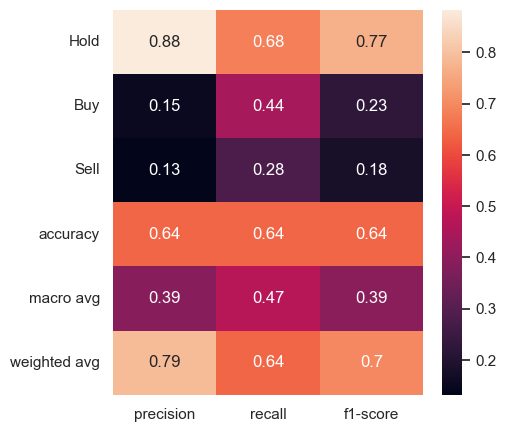

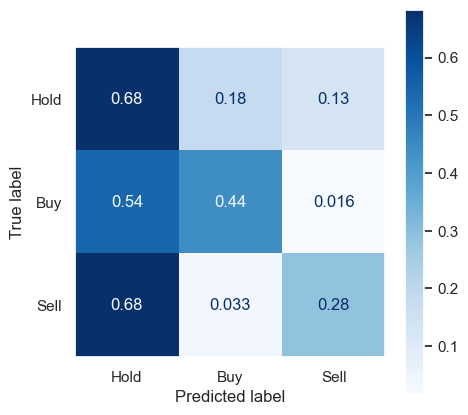

In [48]:
if RUN_MLP:
    plain_classification_report(test_labels, mlp_prediction)
    classification_report_display(test_labels, mlp_prediction)
    confusion_matrix_display(test_labels, mlp_prediction)

<h1 style="font-size:30px;"> <center> LSTM </center> </h1>

C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\NEO\anaconda3\envs\cnn-ta\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in lab

              precision    recall  f1-score   support

        Hold       0.87      1.00      0.93      1695
         Buy       0.00      0.00      0.00       127
        Sell       0.00      0.00      0.00       123

    accuracy                           0.87      1945
   macro avg       0.29      0.33      0.31      1945
weighted avg       0.76      0.87      0.81      1945



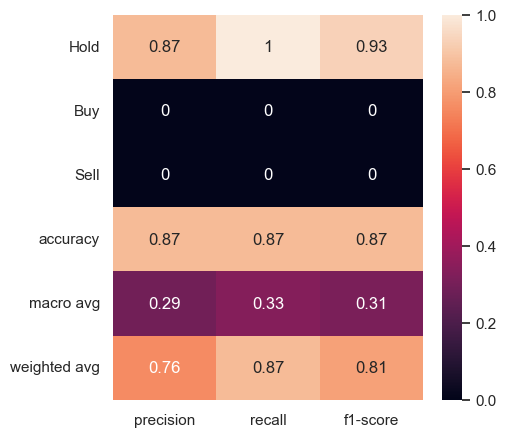

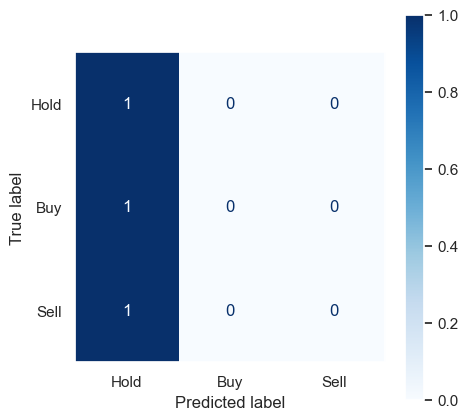

In [49]:
if RUN_LSTM:
    plain_classification_report(test_labels, lstm_prediction)
    classification_report_display(test_labels, lstm_prediction)
    confusion_matrix_display(test_labels, lstm_prediction)

<h1 style="font-size:30px;"> <center> GRU </center> </h1>

              precision    recall  f1-score   support

        Hold       0.88      0.69      0.77      1695
         Buy       0.15      0.36      0.21       127
        Sell       0.14      0.37      0.20       123

    accuracy                           0.65      1945
   macro avg       0.39      0.47      0.40      1945
weighted avg       0.79      0.65      0.70      1945



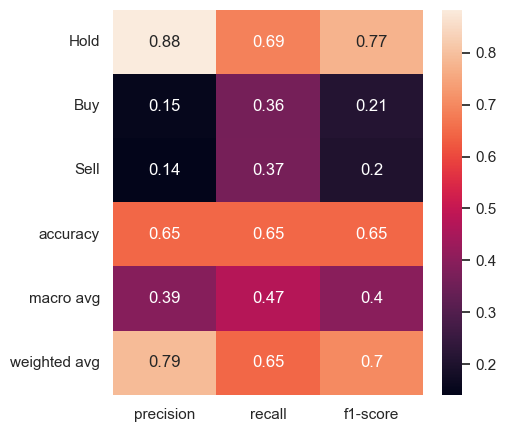

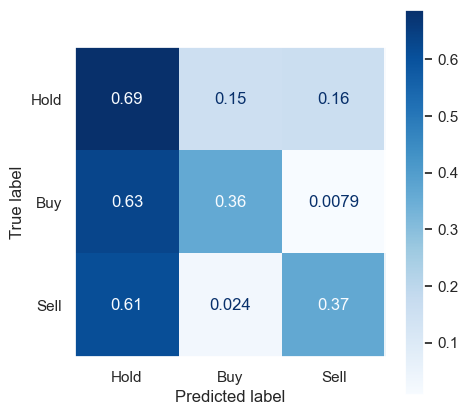

In [50]:
if RUN_GRU:
    plain_classification_report(test_labels, gru_prediction)
    classification_report_display(test_labels, gru_prediction)
    confusion_matrix_display(test_labels, gru_prediction)

<h1 style="font-size:30px;"> <center> CNN-2D </center> </h1>

              precision    recall  f1-score   support

        Hold       0.89      0.74      0.81      1695
         Buy       0.17      0.35      0.23       127
        Sell       0.16      0.34      0.22       123

    accuracy                           0.69      1945
   macro avg       0.41      0.48      0.42      1945
weighted avg       0.79      0.69      0.73      1945



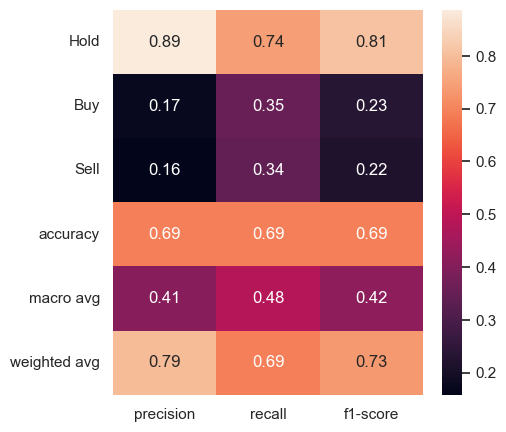

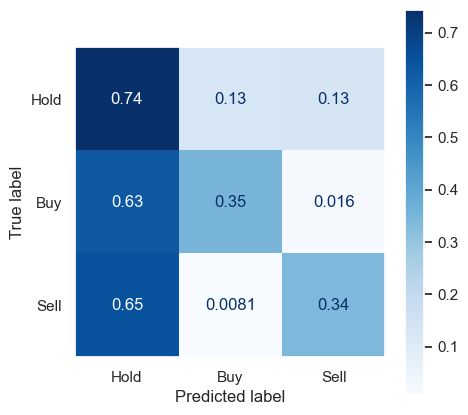

In [51]:
if RUN_CNN:
    plain_classification_report(test_labels, cnn2d_prediction)
    classification_report_display(test_labels, cnn2d_prediction)
    confusion_matrix_display(test_labels, cnn2d_prediction)

<h1 style="font-size:40px;"> <center> FINANCIAL EVALUATION </center> </h1>

In [52]:
test_prices = prices.loc[test_indices]
test_prices

,Open,High,Low,Close,Volume
Date,,,,,
2015-01-13 00:00:00-05:00,175.661530,176.831924,172.554840,173.905960,214553300
2015-01-14 00:00:00-05:00,171.814728,173.062576,170.885315,172.856033,192991100
2015-01-15 00:00:00-05:00,173.518692,173.845703,171.152100,171.272583,176613900
2015-01-16 00:00:00-05:00,171.057449,173.682220,170.868118,173.518707,211879600
2015-01-20 00:00:00-05:00,174.181335,174.456741,172.262253,173.888748,130991100
...,...,...,...,...,...
2022-12-15 00:00:00-05:00,391.005341,391.947418,384.648926,386.374390,117705900
2022-12-16 00:00:00-05:00,383.715546,385.110229,379.591309,381.812805,119858000
2022-12-19 00:00:00-05:00,382.012054,382.360748,376.841797,378.575165,79878100


In [53]:
configurations = {
    "ticker": TICKER,
    "benchmark_ticker": BENCHMARK_TICKER,
    "ohlcv": test_prices,
    "risk_free_rate": 0.05 / 252,
    "initial_capital": 1000,
    "commission": 1,
    "alpha": 0.05,
    "threshold": 0,
    "order": 1,
    "order_type": "market",  # "market" or "limit"
    "short": False,
    "short_fee": 1,
    "standard_take_profit": False,
    "trailing_take_profit": False,
    "take_profit_ratio": 100,
    "standard_stop_loss": False,
    "trailing_stop_loss": False,
    "stop_loss_ratio": 100,
    "leverage": 1,
    "miss_rate": 10,
    "show_initial_configuration": True,
    "show_tables": True,
    "show_charts": True,
    "show_time": True,
    "precision_point": 3,
}

<h1 style="font-size:30px;"> <center> Buy & Hold </center> </h1>

In [54]:
if RUN_BUY_AND_HOLD:
    configurations["predictions"] = buy_and_hold_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.51 seconds.



C:\Users\NEO\Desktop\Projects\CNN-TA Optimized\trading_modules\create_backtest.py:365: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\NEO\Desktop\Projects\CNN-TA Optimized\trading_modules\create_backtest.py:173: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\NEO\Desktop\Projects\CNN-TA Optimized\trading_modules\create_backtest.py:181: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\NEO\Desktop\Projects\CNN-TA Optimized\trading_modules\create_backtest.py:189: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\NEO\Desktop\Projects\CNN-TA Optimized\trading_modules\create_backtest.py:194: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\NEO\Desktop\Projects\CNN-TA Optimized\trading_modules\create_backtest.py:199: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\NEO\Desktop\Projects\CNN-TA Optimized\trading_modules\create_backtest.py:210: RuntimeWarnin

<h1 style="font-size:30px;"> <center> Random Prediction </center> </h1>

In [55]:
if RUN_RANDOM_PREDICTION:
    configurations["predictions"] = random_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.5 seconds.



<h1 style="font-size:30px;"> <center> RSI </center> </h1>

In [56]:
if RUN_RSI:
    configurations["predictions"] = rsi_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.53 seconds.



<h1 style="font-size:30px;"> <center> EMA Crossover </center> </h1>

In [57]:
if RUN_EMA_CROSSOVER:
    configurations["predictions"] = ema_crossover_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.45 seconds.



<h1 style="font-size:30px;"> <center> Bollinger Bands </center> </h1>

In [58]:
if RUN_BOLLINGER_BANDS:
    configurations["predictions"] = bollinger_bands_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.47 seconds.



<h1 style="font-size:30px;"> <center> MLP </center> </h1>

In [59]:
if RUN_MLP:
    configurations["predictions"] = mlp_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.44 seconds.



<h1 style="font-size:30px;"> <center> LSTM </center> </h1>

In [60]:
if RUN_LSTM:
    configurations["predictions"] = lstm_prediction
    metrics = financial_evaluation(**configurations)

No trade executed


<h1 style="font-size:30px;"> <center> GRU </center> </h1>

In [61]:
if RUN_GRU:
    configurations["predictions"] = gru_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.47 seconds.



<h1 style="font-size:30px;"> <center> CNN </center> </h1>

In [62]:
if RUN_CNN:
    configurations["predictions"] = cnn2d_prediction
    metrics = financial_evaluation(**configurations)


Backtest was completed in 0 minutes and 0.52 seconds.



In [63]:
notebook_end_time = time.time()
print(
    f"Notebook run in {round(int(notebook_end_time - notebook_start_time) / 60, 2)} minutes"
)

Notebook run in 113.53 minutes
